#Importing Libraries
In this section, we import a suite of essential libraries required for our data processing and machine learning pipeline. 

- **PySpark SQL Functions and Types**: These are critical for handling data operations in Spark, allowing us to define schema and perform transformations.
- **Pandas**: A foundational tool for data analysis and manipulation in Python, ideal for handling tabular data.
- **Data Visualization Libraries**: Seaborn and Matplotlib are imported for their powerful plotting capabilities, enabling us to visualize data insights effectively.
- **PySpark ML**: This collection of libraries from PySpark's machine learning module will be used to construct our machine learning pipeline, including preprocessing, model fitting, and evaluation.

In [0]:
# PySpark SQL Functions and Types
from pyspark.sql import functions as F
from pyspark.sql.types import StructType, StructField, IntegerType, StringType, FloatType
from pyspark.sql.functions import count, col, when, avg

# Pandas and numpy for Data Manipulation
import pandas as pd
import numpy as np

# Data Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

# PySpark ML for Machine Learning
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.regression import LinearRegression, DecisionTreeRegressor, RandomForestRegressor
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer


#Loading Database
Here, we are utilizing PySpark's DataFrame API to read in a CSV file that contains employee compensation data. The `option("header", "true")` indicates that the first row of the file includes column headers. We are loading this data from a distributed file system location, which is specified by the path. The resulting DataFrame, `df1`, will be used for our data analysis and machine learning tasks.

In [0]:
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dcarvalh@gmu.edu/employee_compensation.csv")

We can see the data type for every feature is string so we need to change the schema

In [0]:
df1.printSchema()

root
 |-- Organization Group Code: string (nullable = true)
 |-- Job Family Code: string (nullable = true)
 |-- Job Code: string (nullable = true)
 |-- Year Type: string (nullable = true)
 |-- Year: string (nullable = true)
 |-- Organization Group: string (nullable = true)
 |-- Department Code: string (nullable = true)
 |-- Department: string (nullable = true)
 |-- Union Code: string (nullable = true)
 |-- Union: string (nullable = true)
 |-- Job Family: string (nullable = true)
 |-- Job: string (nullable = true)
 |-- Employee Identifier: string (nullable = true)
 |-- Salaries: string (nullable = true)
 |-- Overtime: string (nullable = true)
 |-- Other Salaries: string (nullable = true)
 |-- Total Salary: string (nullable = true)
 |-- Retirement: string (nullable = true)
 |-- Health and Dental: string (nullable = true)
 |-- Other Benefits: string (nullable = true)
 |-- Total Benefits: string (nullable = true)
 |-- Total Compensation: string (nullable = true)



From the below commmand we have manually changed the datatypes to our desired datatypes 

In [0]:
schema = StructType([
    StructField("Organization Group Code", IntegerType(), True),
    StructField("Job Family Code", StringType(), True),
    StructField("Job Code", StringType(), True),
    StructField("Year Type", StringType(), True),
    StructField("Year", IntegerType(), True),
    StructField("Organization Group", StringType(), True),
    StructField("Department Code", StringType(), True),
    StructField("Department", StringType(), True),
    StructField("Union Code", FloatType(), True),
    StructField("Union", StringType(), True),
    StructField("Job Family", StringType(), True),
    StructField("Job", StringType(), True),
    StructField("Employee Identifier", IntegerType(), True),
    StructField("Salaries", FloatType(), True),
    StructField("Overtime", FloatType(), True),
    StructField("Other Salaries", FloatType(), True),
    StructField("Total Salary", FloatType(), True),
    StructField("Retirement", FloatType(), True),
    StructField("Health and Dental", FloatType(), True),
    StructField("Other Benefits", FloatType(), True),
    StructField("Total Benefits", FloatType(), True),
    StructField("Total Compensation", FloatType(), True)
])

df1 = spark.read.format("csv") \
    .option("header", "true") \
    .schema(schema) \
    .load("dbfs:/FileStore/shared_uploads/dcarvalh@gmu.edu/employee_compensation.csv")

In [0]:
display(df1.limit(10))

Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,Job Family,Job,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
1,1000,1021,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Administrator 1,37730,57534.65,0.0,0.0,57534.65,11253.16,11961.34,4532.63,27747.13,85281.78
1,1000,1023,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Administrator 3,26574,57678.5,0.0,0.0,57678.5,10284.88,7176.8,4755.14,22216.82,79895.32
1,1000,1031,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Trainer-Assistant,8148,63532.93,0.0,0.0,63532.93,12495.83,12918.24,4702.71,30116.78,93649.71
1,1000,1054,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Business Analyst-Principal,27436,101274.51,0.0,-7058.59,94215.92,19644.45,12918.24,7458.76,40021.45,134237.38
1,1000,1062,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Programmer Analyst,37730,5084.0,0.0,0.0,5084.0,1083.9,956.91,387.5,2428.31,7512.31
1,1000,1064,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Prg Analyst-Principal,36223,34456.0,0.0,0.0,34456.0,7346.0,3827.63,2579.95,13753.58,48209.58
1,1000,1070,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Project Director,51426,139889.0,0.0,0.0,139889.0,26799.23,12918.24,9791.54,49509.01,189398.02
1,1000,1094,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IT Operations Support Admin IV,26574,46572.0,0.0,0.0,46572.0,9929.16,5741.44,3822.28,19492.88,66064.88
1,1200,1232,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Personnel,Training Officer,37983,84681.53,0.0,0.0,84681.53,16661.84,12918.24,6838.44,36418.52,121100.05
1,1600,1654,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21","Payroll, Billing & Accounting",Accountant III,16858,10611.01,0.0,0.0,10611.01,1879.2,1435.36,827.09,4141.65,14752.66


In this step, we perform an initial data quality check by calculating the total number of rows and identifying the column names in our dataset. Furthermore, we conduct a missing value analysis for each column. Using PySpark's DataFrame API, we count the number of null or missing entries per column, which helps in understanding the completeness of our data. This information is crucial as it can inform subsequent data cleaning and preprocessing steps.

In [0]:
total_rows = df1.count()
columns = df1.columns
missing_values = df1.select([count(when(col(c).isNull(), c)).alias(c) for c in columns])
display(missing_values)

Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,Job Family,Job,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,0,0,0,0,0,2,2,351,351,0,5,0,0,0,0,0,0,0,0,0,0


In [0]:
df1 = df1.dropna(how='any')

In [0]:
total_rows = df1.count()
columns = df1.columns
missing_values = df1.select([count(when(col(c).isNull(), c)).alias(c) for c in columns])
display(missing_values)

Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,Job Family,Job,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Correlation Analysis
After converting our Spark DataFrame to a Pandas DataFrame, we proceed to calculate the correlation matrix. This matrix is a statistical tool that contains correlation coefficients between variables. Each cell in the matrix shows the correlation between two variables. The value ranges from -1 to 1, where:
- 1 indicates a strong positive correlation,
- -1 indicates a strong negative correlation, and
- 0 indicates no correlation.

We then use Seaborn's heatmap function to visualize this correlation matrix. The heatmap is a useful graphical representation that can quickly show how the different variables are related to one another. In this visualization, warmer colors (red) indicate a higher positive correlation, and cooler colors (blue) denote a higher negative correlation. Annotations within the heatmap cells provide the exact correlation values.

This step is crucial for feature selection and understanding the relationships between variables, which can have implications for model performance in predictive analytics tasks.

/root/.ipykernel/1012/command-3998555155749864-2656747743:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = pandas_df.corr()


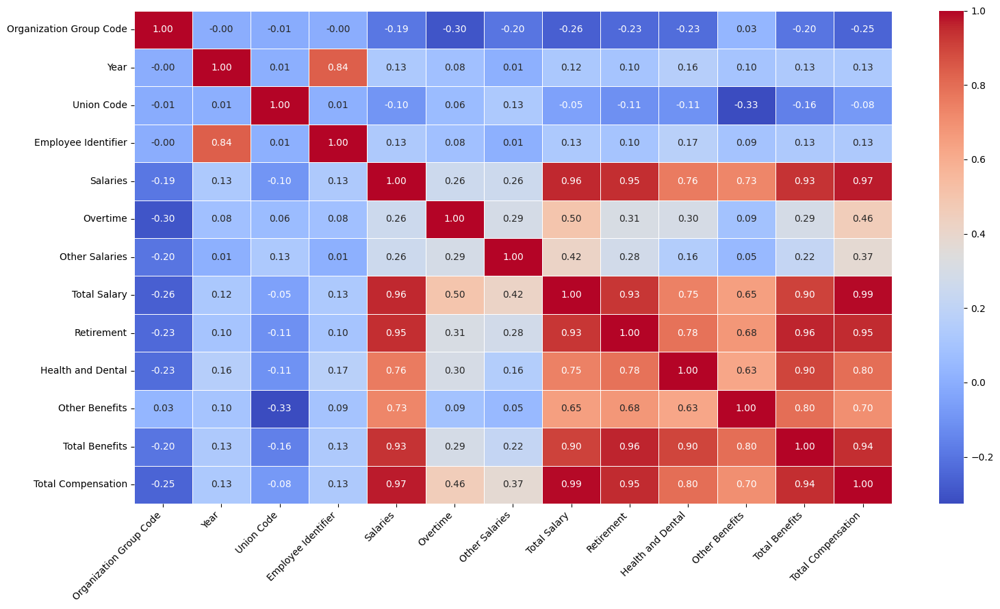

In [0]:
pandas_df = df1.toPandas()
corr_matrix = pandas_df.corr()

plt.figure(figsize=(16, 9))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.show()

# Scatter Matrix for Salary Data

To explore potential relationships between 'Salaries', 'Total Salary', and 'Total Compensation', we first filter these columns and convert the resulting Spark DataFrame to a Pandas DataFrame. Using the `scatter_matrix` function from Pandas, we generate a scatter matrix that provides pairwise scatter plots for each variable combination. This visualization allows us to observe the correlation, trends, and concentration of points between the different types of compensation.

The scatter matrix also includes histograms on the diagonal, giving us a distribution overview of each variable with 50 bins for granularity. The scatter plots are customized with a 'skyblue' color for histograms and 'darkblue' for scatter points, with a small marker size (`s=10`) for clarity. The figure size is set to 12x12 inches to ensure that each plot is large enough to be informative.

Adjusting `plt.rcParams['axes.labelsize']` to 12 ensures that axis labels are readable. The `tight_layout` function call optimizes the spacing around the plots to prevent label overlap, enhancing the readability of the entire matrix.


<Figure size 1200x1200 with 0 Axes>

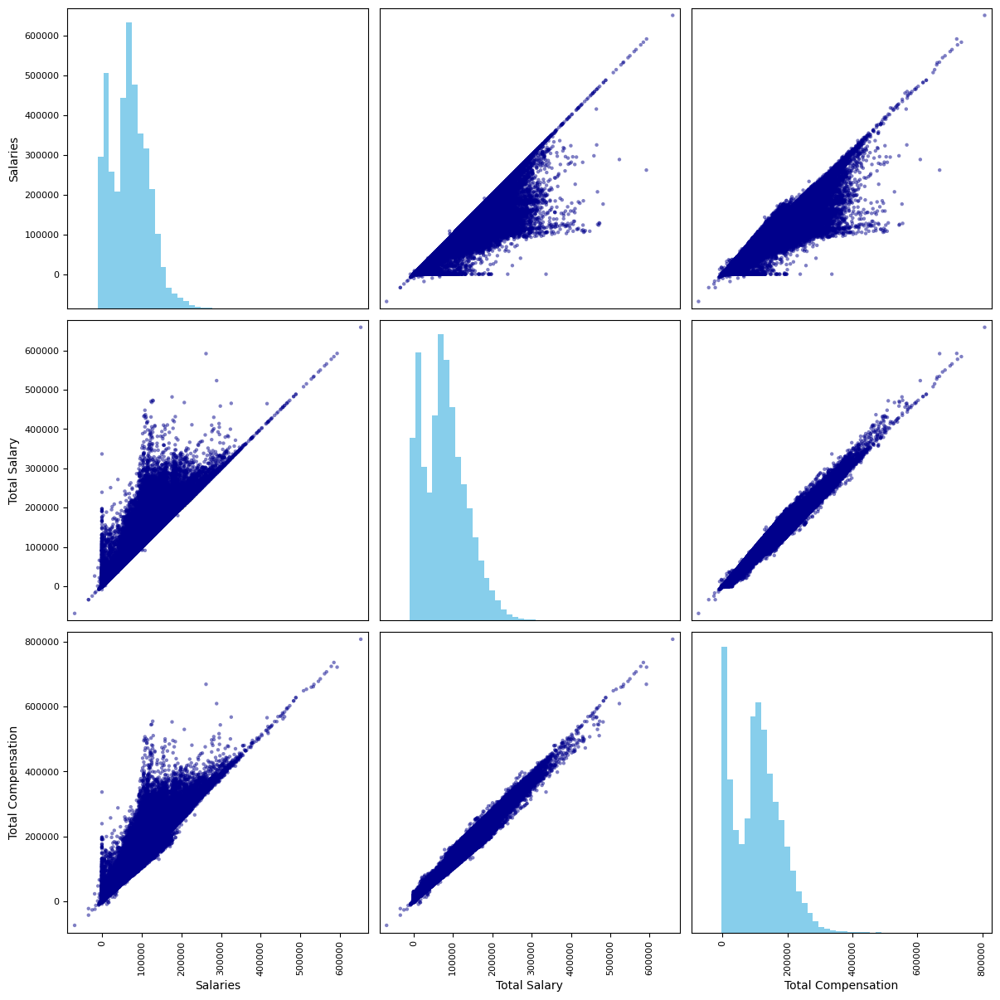

In [0]:
pandas_df = df1.select(['Salaries', 'Total Salary', 'Total Compensation']).toPandas()
plt.figure(figsize=(12, 12))
scatter_matrix(pandas_df, alpha=0.5, figsize=(12, 12), diagonal='hist', hist_kwds={'bins':50, 'color':'skyblue'}, color='darkblue', marker='o', s=10)
plt.rcParams['axes.labelsize'] = 12
plt.tight_layout(pad=0.5, w_pad=1.0, h_pad=1.0)
plt.show()

# Scatter Matrix for Benefit and Salary Analysis

This section of the code is dedicated to visualizing the relationships between various financial aspects of employee compensation: 'Retirement', 'Health and Dental', 'Other Benefits', and 'Salaries'. We begin by selecting these columns from our Spark DataFrame and converting them to a Pandas DataFrame for easier manipulation and visualization.

We utilize the `scatter_matrix` function to create a matrix of scatter plots that allow us to observe the pairwise relationships between these financial variables. The scatter matrix also includes histograms on the diagonal to provide insights into the distribution of each variable. For a clear visualization, we set the following parameters:
- `alpha` set to 0.5 for plot transparency.
- `figsize` set to 12x12 inches to ensure the plots are sufficiently large.
- `diagonal` set to 'hist' to include histograms on the matrix diagonal.
- `hist_kwds` configured with 50 bins and a 'skyblue' color for the histograms.
- Points in the scatter plots are colored 'darkblue', shaped as circles ('o'), and sized at 10 (`s=10`).

We fine-tune the appearance of the scatter matrix by adjusting the axes' label size to 12 for better legibility and applying `tight_layout` to optimize spacing between the plots, ensuring labels and titles are not overlapping and are clearly readable.


<Figure size 1200x1200 with 0 Axes>

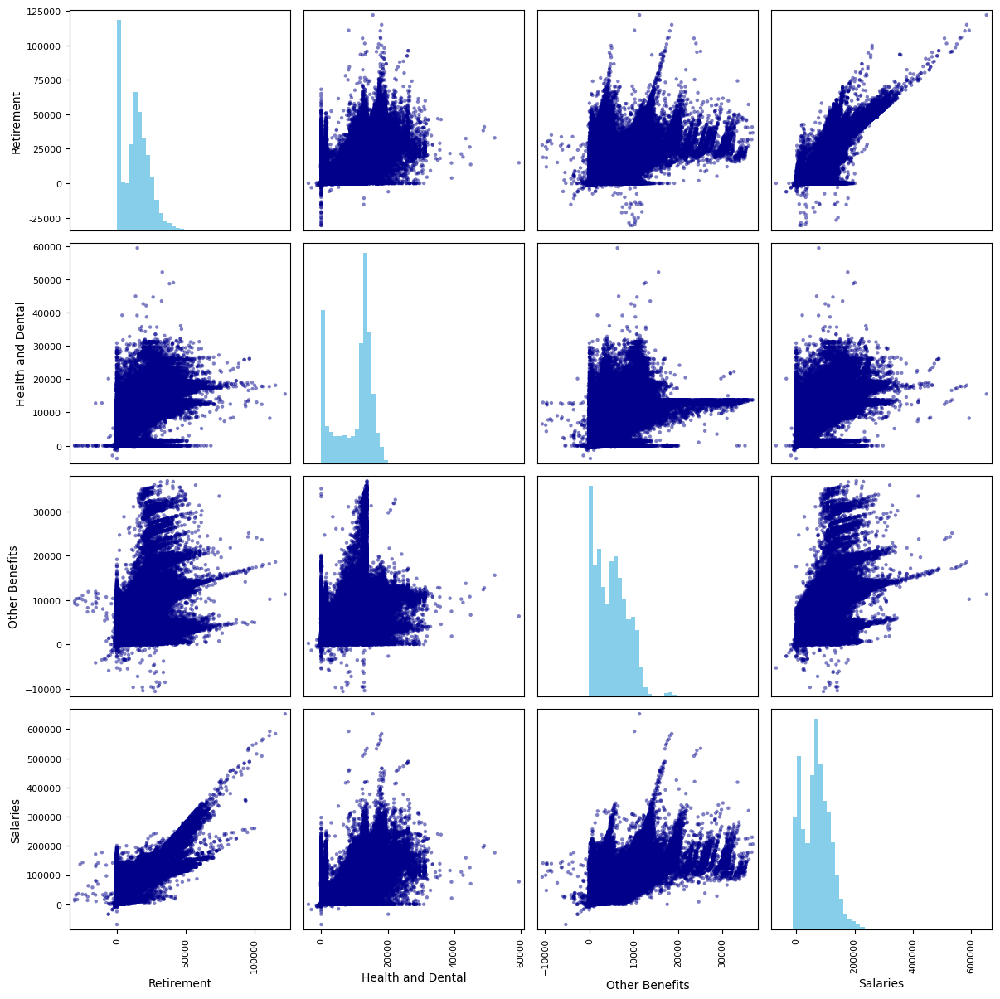

In [0]:
pandas_df1 = df1.select(['Retirement', 'Health and Dental', 'Other Benefits', 'Salaries']).toPandas()
plt.figure(figsize=(12, 12))
scatter_matrix(pandas_df1, alpha=0.5, figsize=(12, 12), diagonal='hist', hist_kwds={'bins':50, 'color':'skyblue'}, color='darkblue', marker='o', s=10)
plt.rcParams['axes.labelsize'] = 12
plt.tight_layout(pad=0.5, w_pad=1.0, h_pad=1.0)
plt.show()

# Kernel Density Estimate of Salaries

In this analysis, we focus on the 'Salaries' column of our dataset to understand its distribution. We achieve this by converting the 'Salaries' column from our Spark DataFrame into a Pandas Series and then plotting its Kernel Density Estimate (KDE).

The KDE is a useful non-parametric way to estimate the probability density function of a continuous random variable. It is a fundamental data smoothing problem where inferences about the population are made based on a finite data sample.

Using Seaborn's `kdeplot` function, we generate a plot that showcases the distribution and density of salaries within our dataset. The `shade` parameter is set to `True`, providing a shaded area under the curve, which helps in visualizing the density more clearly.

The plot is further refined with titles and labels:
- The title 'Kernel Density Estimate for Salaries' gives a clear indication of what the plot represents.
- The x-axis is labeled 'Salaries', denoting the range of salaries.
- The y-axis is labeled 'Density', indicating the probability density of different salary values.

This visualization is an essential part of exploratory data analysis as it provides insight into the shape of the salary distribution, its skewness, and whether there are any peaks or valleys that might warrant further investigation.


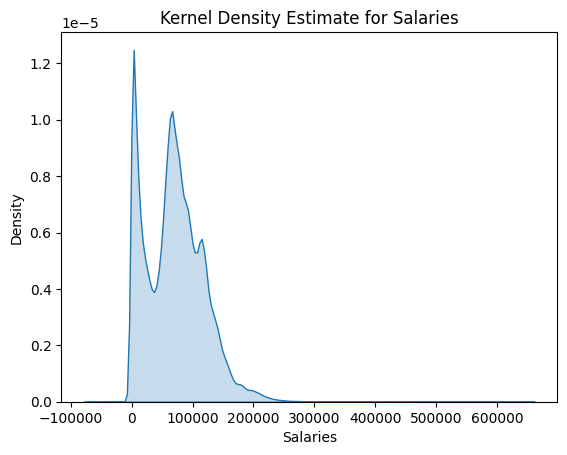

In [0]:
salaries_pd_series = df1.select('Salaries').toPandas()['Salaries']
ax = sns.kdeplot(salaries_pd_series, fill=True)
ax.set_title('Kernel Density Estimate for Salaries')
ax.set_xlabel('Salaries')
ax.set_ylabel('Density')
plt.show()

# Comparative Kernel Density Estimates for Salary-Related Columns

In this visualization, we examine the distribution of several salary-related metrics within our dataset: 'Salaries', 'Total Salary', and 'Total Compensation'. By plotting Kernel Density Estimates (KDEs) for these three columns, we aim to understand their distributions and to identify any patterns or differences between them.

The KDE plots are an excellent way to visualize the probability density of continuous data. They help to see where values are concentrated over the interval of salaries.

For each salary-related column, we apply Seaborn's `kdeplot` function, which creates a KDE for each variable and shades the area under the curve to make the density more apparent. We plot all three distributions on the same figure for easy comparison:

- The figure's size is set to 12 by 6 inches, providing a wide canvas that accommodates all three KDEs without overlap.
- Each `kdeplot` is labeled with the name of the respective column, allowing us to differentiate between the distributions.
- A legend is added to the plot to help identify each distribution, correlating to the 'salary' list.

The resulting plot is titled 'Kernel Density Estimates for Salary Columns', clearly indicating the focus of the analysis. The x-axis ('Value') represents the range of salary values, while the y-axis ('Density') shows the probability density. This comparative view is particularly useful for understanding how each type of salary-related payment is distributed across the dataset and how they relate to each other.


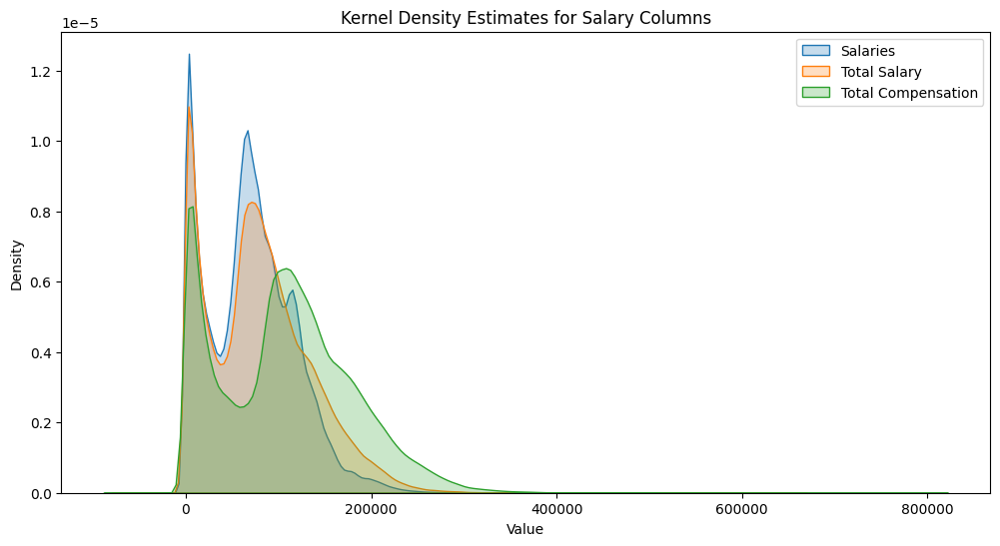

In [0]:
plt.figure(figsize=(12, 6))
salary = ['Salaries', 'Total Salary', 'Total Compensation']

for col in salary:
    sns.kdeplot(pandas_df[col], fill=True)

plt.title('Kernel Density Estimates for Salary Columns')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend(salary)
plt.show()

# Kernel Density Estimates for Compensation Components

This code block is designed to graphically represent the distribution of various components of employee compensation. The components we're analyzing include 'Retirement', 'Health and Dental', 'Other Benefits', and 'Salaries'. By using Kernel Density Estimates (KDE), we can visualize where the data points are concentrated and how they are spread out.

In detail:
- We set up a figure with dimensions 12 by 6 inches, offering a balanced width-to-height ratio for our KDE plots.
- For each of the specified compensation components, we apply the `kdeplot` function from Seaborn to plot their distribution. The `shade` parameter is set to `True` to create a shaded area under each curve, enhancing the visual appeal and readability.
- We explicitly set the x-axis limit from -30,000 to 200,000 using `plt.xlim`, focusing our plot on the range where most of our data lies and excluding outliers or extreme values for clarity.
- The plot is titled 'Kernel Density Estimates for Salary Columns' to reflect the content of the visualization, and axes are labeled 'Value' and 'Density' for clarity.
- A legend that includes all the components plotted is displayed, allowing for easy identification of each curve.

This visualization is particularly useful in comparing the distributions of different salary components, showing potential overlaps and gaps, and understanding the general financial landscape of the employee benefits in the dataset.



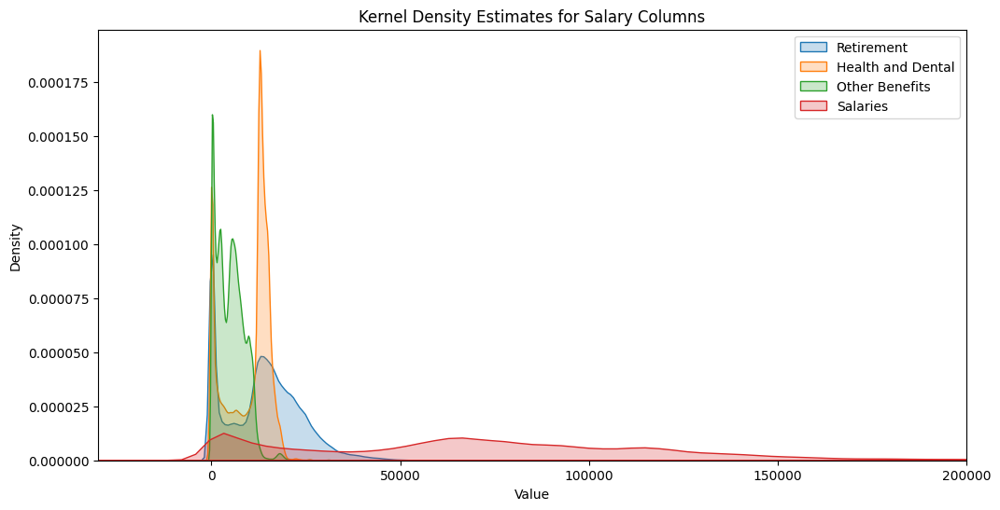

In [0]:

plt.figure(figsize=(12, 6))

salaries = ['Retirement', 'Health and Dental', 'Other Benefits', 'Salaries']
for col in salaries:
    sns.kdeplot(pandas_df1[col], fill=True)

plt.title('Kernel Density Estimates for Salary Columns')
plt.xlabel('Value')
plt.ylabel('Density')
plt.xlim(-30000, 200000)

plt.legend(salaries)
plt.show()

# Filtering Salaries and Counting Specific Rows

In this segment of our data analysis, we're interested in the count of employees earning less than $35,000. To ensure accuracy, we first enforce a consistent data type for the 'Salaries' column by casting it to a `FloatType`. This conversion is necessary because arithmetic operations and comparisons require numerical data types.

With the 'Salaries' column now in the correct format, we apply a filter operation to isolate rows where the salary is below the $35,000 threshold. The `filter` method is used for this purpose, and it's followed by a `count` action which computes the number of rows satisfying our condition.

The final output is printed, giving us the exact number of employees with salaries under $35,000. This information is crucial for understanding the distribution of lower-end salaries within the organization and can be used to inform decisions regarding wage policies or targeted support.

In [0]:
from pyspark.sql.functions import col as column
df1 = df1.withColumn('Salaries', column('Salaries').cast(FloatType()))
count_salaries_less_than_35000 = df1.filter(column('Salaries') < 35000).count()
print("Number of rows with Salaries less than 35000:", count_salaries_less_than_35000)


Number of rows with Salaries less than 35000: 186904


# Filtering for Higher Salaries

In this step, we refine our dataset to focus on employees with higher salaries. Specifically, we are creating a new DataFrame, `df2`, which includes only those records where the 'Salaries' exceed 35,000. This is achieved using PySpark's `filter` method:

- **Filter Condition**: We utilize the `filter` method on our original DataFrame `df1`, applying a condition to select rows where the value in the 'Salaries' column is greater than 35,000. 
- **Usage of `col` Function**: The `col` function from `pyspark.sql.functions` is used to refer to the 'Salaries' column within the DataFrame. This function is crucial for specifying column-based operations in PySpark.
- **Creation of `df2`**: The result of this filtering operation is assigned to `df2`, which becomes a subset of `df1` containing only the desired rows.

This operation is integral for analyses that require focusing on a specific segment of the workforce, in this case, those earning above a certain salary threshold. It demonstrates the use of PySpark's DataFrame transformations to effectively segment and analyze data based on specific criteria.


In [0]:
from pyspark.sql.functions import col as column
df2 = df1.filter(column('Salaries') > 35000)

# Analyzing Top Organization Groups with Lower Salaries

This section of the code is focused on identifying the top organization groups with the highest number of employees earning salaries below 35,000. The process involves several key steps:

1. **Identifying Lower Salaries (org_count_below_35000)**: We start by filtering `df1` for employees with salaries less than 35,000 and grouping them by 'Organization Group'. We count the number of such employees in each group and rename this count to 'org count below 35000'.

2. **Calculating Total Counts (org_total_count)**: Next, we calculate the total count of employees in each organization group by performing a similar grouping on the entire dataset and renaming the count to 'Total Org Count'.

3. **Joining DataFrames**: We then join the two DataFrames, `org_count_below_35000` and `org_total_count`, on the 'Organization Group' column, creating a combined view for comparison.

4. **Percentage Calculation (org_percentage)**: A new column, 'Organization Group%', is added to represent the percentage of employees earning less than 35,000 in each organization group. This is computed by dividing the 'org count below 35000' by the 'Total Org Count' and multiplying by 100.

5. **Sorting and Limiting Results (top_orgs)**: The DataFrame is sorted in descending order based on 'Org Count Below 35000'. We use `limit(10)` to focus on the top 10 organization groups with the highest number of lower salary employees.

6. **Displaying Results**: Finally, we display these top 10 organization groups using `show(10)`, which provides a concise view of where the majority of lower salary cases are concentrated within the organization.

This analysis is crucial for identifying organization groups that may require further investigation or intervention regarding salary distribution and workforce planning.


In [0]:
from pyspark.sql.functions import col as column
org_count_below_35000 = df1.filter(column('Salaries') < 35000) \
                            .groupBy('Organization Group') \
                            .count() \
                            .withColumnRenamed('count', 'org count below 35000')

org_total_count = df1.groupBy('Organization Group') \
                      .count() \
                      .withColumnRenamed('count', 'Total Org Count')

org_joined = org_count_below_35000.join(org_total_count, 'Organization Group')

org_percentage = org_joined.withColumn('Organization Group%', 
                                       (column('org Count Below 35000') / column('Total org Count')) * 100)

top_orgs = org_percentage.orderBy(column('Org Count Below 35000').desc()).limit(10)

top_orgs.show(10)

+--------------------+---------------------+---------------+-------------------+
|  Organization Group|org count below 35000|Total Org Count|Organization Group%|
+--------------------+---------------------+---------------+-------------------+
|Public Works, Tra...|                48480|         215688|  22.47691109380216|
|    Community Health|                39781|         150106| 26.501938630034775|
|Culture & Recreation|                36335|          61860|  58.73747171031361|
|Human Welfare & N...|                24823|          61678| 40.246116929861536|
|General Administr...|                18569|          62123|  29.89070070666259|
|   Public Protection|                18452|         130982| 14.087431860866378|
|General City Resp...|                  464|            482|   96.2655601659751|
+--------------------+---------------------+---------------+-------------------+



# Departmental Analysis of Lower Salary Brackets

This code segment focuses on analyzing the distribution of salaries within each department, particularly targeting employees earning less than 35,000. The sequence of operations is as follows:

1. **Filtering Lower Salaries (dep_count_below_35000)**: Initially, we filter `df1` to identify employees with salaries below 35,000 and group these records by 'Department'. We count the occurrences in each department and rename this count to 'Department Count Below 35000' for clarity.

2. **Calculating Total Counts per Department (dep_total_count)**: In parallel, we calculate the total count of employees in each department by grouping the original dataset and renaming the count to 'Total Department Count'.

3. **Joining DataFrames**: We join the two DataFrames, `dep_count_below_35000` and `dep_total_count`, on the 'Department' column. This merged DataFrame allows us to compare the count of lower-earning employees against the total count in each department.

4. **Percentage Calculation (dep_percentage)**: A new column, 'Department %', is created. It represents the percentage of employees earning less than 35,000 in each department, calculated as ('Department Count Below 35000' / 'Total Department Count') * 100.

5. **Sorting and Displaying Top Departments (dep_final)**: The DataFrame is sorted in descending order based on 'Department Count Below 35000'. This prioritizes departments with the highest number of employees in lower salary brackets. The `show(10)` function then displays the top 10 departments according to this criterion.

The purpose of this analysis is to identify departments with a significant proportion of employees in lower salary ranges. Such insights can be instrumental for departmental budget reviews, compensation policies, and workforce management.


In [0]:
from pyspark.sql.functions import col as column
dep_count_below_35000 = df1.filter(column('Salaries') < 35000) \
                           .groupBy('Department') \
                           .count() \
                           .withColumnRenamed('count', 'Department Count Below 35000')

dep_total_count = df1.groupBy('Department') \
                     .count() \
                     .withColumnRenamed('count', 'Total Department Count')

dep_joined = dep_count_below_35000.join(dep_total_count, 'Department')

dep_percentage = dep_joined.withColumn('Department %', 
                                       (column('Department Count Below 35000') / column('Total Department Count')) * 100)

dep_final = dep_percentage.sort(column('Department Count Below 35000').desc())

dep_final.show(10)

+--------------------+----------------------------+----------------------+------------------+
|          Department|Department Count Below 35000|Total Department Count|      Department %|
+--------------------+----------------------------+----------------------+------------------+
|   DPH Public Health|                       24376|                 82856|29.419716134015644|
|       Public Health|                       15405|                 67250|22.907063197026023|
|REC Recreation & ...|                       14852|                 21282| 69.78667418475708|
|HSA Human Service...|                       14569|                 31290|  46.5612016618728|
|MTA Municipal Tra...|                       13408|                 55776|24.039013195639704|
|Recreation And Pa...|                       11524|                 17205| 66.98052891601279|
|Municipal Transpo...|                        9214|                 46030|20.017379969585054|
|      Human Services|                        7982|         

# Top Jobs with Highest Number of Employees Earning Below 35,000

This code segment is designed to analyze the prevalence of lower salaries within various job titles. The sequence of steps is as follows:

1. **Filtering and Grouping by Job Title (job_count_below_35000)**: We begin by filtering `df1` for employees with salaries below 35,000 and group these records by the 'Job' column. The number of employees in each job title earning below this threshold is counted and the count column is renamed to 'Job Count Below 35000' for clarity.

2. **Calculating Total Employee Counts per Job (job_total_count)**: We then calculate the total count of employees for each job title across the entire dataset. This is achieved by grouping by 'Job' and counting, followed by renaming the count column to 'Total Job Count'.

3. **Joining DataFrames**: The two DataFrames, `job_count_below_35000` and `job_total_count`, are joined based on the 'Job' column. This merged DataFrame (`job_joined`) allows us to compare the count of lower-earning employees against the total count for each job title.

4. **Calculating the Percentage (job_percentage)**: A new column, 'Job %', is added to `job_joined`. This column shows the percentage of employees earning less than 35,000 in each job title, calculated as ('Job Count Below 35000' / 'Total Job Count') * 100.

5. **Identifying Top Jobs (top_jobs)**: The DataFrame is sorted in descending order based on 'Job Count Below 35000', and we limit the output to the top 10 job titles using `limit(10)`. 

6. **Displaying the Results**: The top 10 job titles with the highest number of employees earning below 35,000 are displayed using `show(10)`. This provides a focused view of the job titles most affected by lower salary ranges.

This analysis is crucial for understanding which job titles have the highest proportion of employees in lower salary brackets, offering insights into compensation structures and potential areas for salary review or adjustment.


In [0]:
from pyspark.sql.functions import col as column
job_count_below_35000 = df1.filter(column('Salaries') < 35000) \
                            .groupBy('Job') \
                            .count() \
                            .withColumnRenamed('count', 'Job Count Below 35000')

job_total_count = df1.groupBy('Job') \
                      .count() \
                      .withColumnRenamed('count', 'Total Job Count')

job_joined = job_count_below_35000.join(job_total_count, 'Job')

job_percentage = job_joined.withColumn('Job %', 
                                       (column('Job Count Below 35000') / column('Total Job Count')) * 100)

top_jobs = job_percentage.orderBy(column('Job Count Below 35000').desc()).limit(10)

top_jobs.show(10)

+--------------------+---------------------+---------------+------------------+
|                 Job|Job Count Below 35000|Total Job Count|             Job %|
+--------------------+---------------------+---------------+------------------+
|       Special Nurse|                15962|          25285| 63.12833695867115|
|Public Service Tr...|                13148|          13690|  96.0409057706355|
|   Recreation Leader|                11525|          11577| 99.55083354927874|
|Public Svc Aide-P...|                10920|          10956| 99.67141292442497|
|    Transit Operator|                 9944|          43373| 22.92670555414659|
|        Library Page|                 3951|           4416| 89.47010869565217|
|        Junior Clerk|                 3489|           3834| 91.00156494522692|
|School Crossing G...|                 3413|           3413|             100.0|
|           Custodian|                 2998|          13525|22.166358595194087|
|               Clerk|                 2

# Kernel Density Estimates of Salaries Over Different Years

This code block is designed to analyze the distribution of salaries across different years in our dataset, `df2`. The analysis involves several steps:

1. **Extracting Unique Years**: First, we identify all the unique years present in the 'Year' column of `df2`. This is done by selecting distinct years, collecting them into a list, and storing them in `unique_years`.

2. **Setting Up the Plot**: We initialize a figure with dimensions 15x8 inches to provide ample space for visualizing the salary distributions for each year.

3. **Iterative KDE Plotting**:
   - For each unique year in `unique_years`, we perform the following steps:
   - **Filtering by Year**: We filter `df2` to obtain only the rows corresponding to the current year in the loop.
   - **Collecting Salaries**: The 'Salaries' column values are extracted, flattened from a DataFrame to a list, and then converted into a Pandas Series.
   - **Plotting the KDE**: A Kernel Density Estimate plot is generated for each year's salaries using Seaborn's `kdeplot`. Each plot is labeled with the corresponding year.

4. **Customizing the Plot**:
   - The plot is titled 'Kernel Density Estimate of Salaries by Year' to reflect its purpose.
   - The x-axis is labeled 'Salaries', and its limit is set to a range of 0 to 300,000 for a focused view.
   - The y-axis is labeled 'Density', indicating the probability density of salaries.
   - A legend is added with the title 'Year' to distinguish between the different years in the plot.

By visualizing the salary distributions for each year as separate KDE plots, we can compare how the salary trends have evolved over time. This visualization is particularly useful for spotting changes in salary distribution, such as shifts in the concentration of salaries or changes in the range of salaries paid across different years.


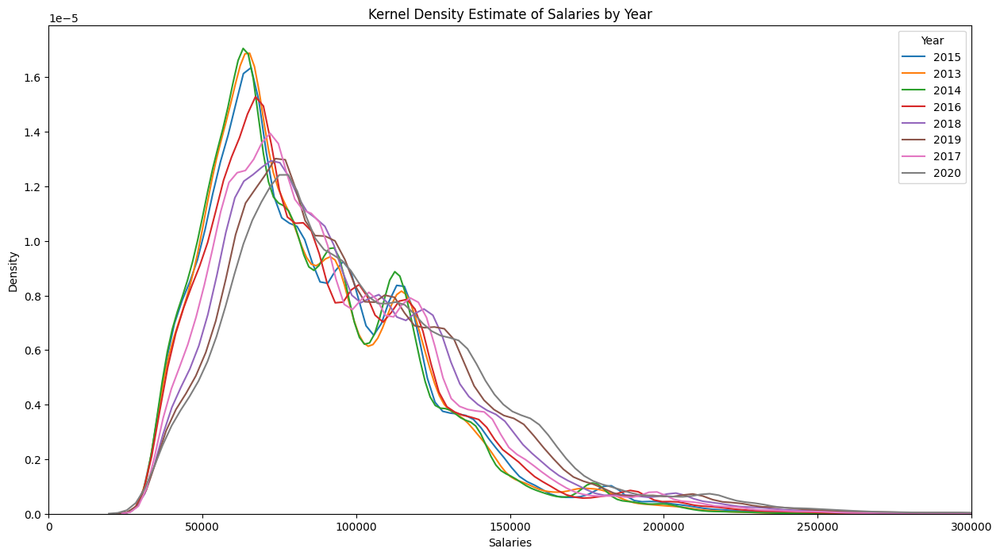

In [0]:
unique_years = [row['Year'] for row in df2.select('Year').distinct().collect()]

plt.figure(figsize=(15, 8))

for year in unique_years:
    salaries_for_year = df2.filter(df2['Year'] == year).select('Salaries').rdd.flatMap(lambda x: x).collect()
    salaries_pd_series = pd.Series(salaries_for_year)
    sns.kdeplot(salaries_pd_series, label=str(year))
plt.title('Kernel Density Estimate of Salaries by Year')
plt.xlabel('Salaries')
plt.xlim(0,300000)
plt.ylabel('Density')
plt.legend(title='Year')
plt.show()

# Overtime Distribution Analysis Across Organization Groups

In this analysis, we examine the distribution of overtime hours across different organization groups in `df2`. The process involves the following steps:

1. **Identifying Unique Organization Groups**: We start by extracting all distinct organization groups from the 'Organization Group' column. These unique values are collected into a list named `org_groups`.

2. **Setting Up the Visualization**: We prepare a figure with dimensions 15x8 inches to ensure a clear and spacious visualization for comparing multiple distributions.

3. **Iterative KDE Plotting**:
   - For each organization group in `org_groups`, the following steps are executed:
     - **Filtering by Organization Group**: We filter `df2` to select data for the current organization group.
     - **Collecting Overtime Data**: The 'Overtime' column values are gathered into a list and then plotted.
     - **KDE Plot Generation**: A Kernel Density Estimate (KDE) plot for the overtime data is created using Seaborn's `kdeplot`, labeled with the organization group's name.

4. **Customizing the Plot**:
   - The x-axis limit is set between -10,000 and 25,000 to focus on a relevant range of overtime hours.
   - The plot is titled 'Kernel Density Estimate of Overtime by Organization Group', accurately reflecting its content.
   - The x-axis is labeled 'Overtime', and the y-axis is labeled 'Density'.
   - A legend is included to identify the KDE plots corresponding to different organization groups.

This visualization is crucial to understand how overtime distribution varies among different organization groups. By comparing the KDEs, we can discern patterns and outliers in overtime allocation, contributing to insights on workforce management and operational practices across the organization.


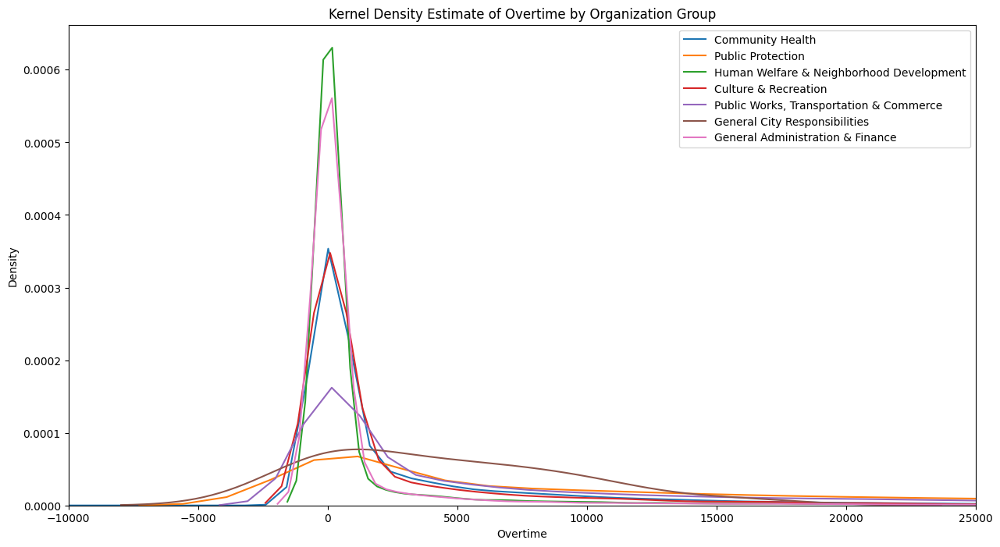

In [0]:
org_groups = df2.select('Organization Group').distinct().rdd.flatMap(lambda x: x).collect()

plt.figure(figsize=(15, 8))
for org_group in org_groups:
    overtime_data = df2.filter(df2['Organization Group'] == org_group).select('Overtime').rdd.flatMap(lambda x: x).collect()
    sns.kdeplot(overtime_data, label=org_group)
plt.xlim(-10000, 25000)

plt.title('Kernel Density Estimate of Overtime by Organization Group')
plt.xlabel('Overtime')
plt.ylabel('Density')
plt.legend()
plt.show()

# Analysis of Top 5 Jobs by Compensation Excluding Overtime and Other Salaries

This section of the code is dedicated to identifying the top 5 jobs with the highest average total compensation, excluding overtime and other salaries. The process is divided into several steps:

1. **Aggregation by Job Title**: We start by grouping the data in `df1` by the 'Job' column. For each job, we calculate the average 'Total Compensation', 'Overtime', and 'Other Salaries'. These averages are represented with respective aliases for clarity in subsequent operations.

2. **Calculating Base Compensation**: A new column, 'Total Compensation No Extras', is added to the aggregated DataFrame (`df_groupby_Job`). This column represents the average total compensation minus the averages of both overtime and other salaries. The purpose is to focus on the base salary component of the compensation.

3. **Identifying Top 5 Jobs**: The DataFrame is sorted in descending order based on 'Total Compensation No Extras'. We then select the top 5 jobs using the `limit(5)` method to focus on those with the highest base compensation.

4. **Data Preparation for Visualization**: The resulting DataFrame (`top_comp_no_extras`) is converted to a Pandas DataFrame for easier plotting, with 'Job' set as the index.

5. **Bar Plot Creation**: A bar plot is generated using Pandas to visualize the 'Total Compensation No Extras' for these top 5 jobs. The plot size is set to 10x6 inches to ensure good readability.

6. **Plot Customization and Display**:
   - The y-axis is labeled 'Total Compensation No Extras' to clearly indicate the metric being plotted.
   - The plot is titled 'Top 5 Jobs by Total Compensation No Extras', effectively summarizing the focus of the visualization.

This analysis is valuable for understanding which job titles offer the highest base compensation, independent of additional earnings like overtime and other salaries. It provides insights into the compensation structure across different job roles, which can be crucial for salary benchmarking and organizational budget planning.


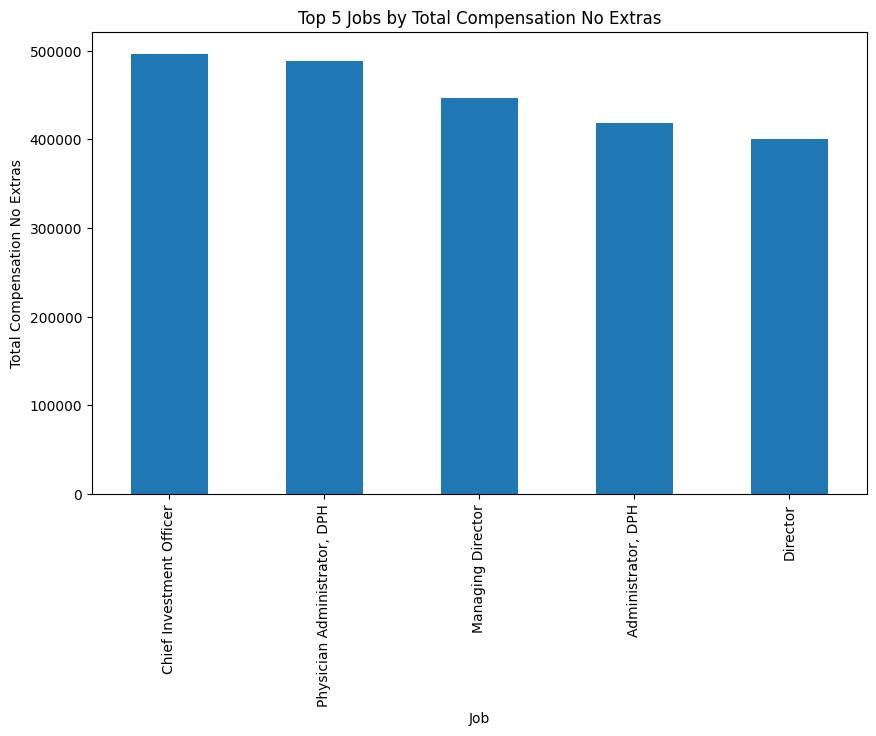

In [0]:
from pyspark.sql.functions import col as column

df_groupby_Job = df1.groupBy('Job').agg(
    avg('Total Compensation').alias('Average Total Compensation'),
    avg('Overtime').alias('Average Overtime'),
    avg('Other Salaries').alias('Average Other Salaries')
)

df_groupby_Job = df_groupby_Job.withColumn(
    'Total Compensation No Extras',
    column('Average Total Compensation') - column('Average Overtime') - column('Average Other Salaries')
)
top_comp_no_extras = df_groupby_Job.orderBy(column('Total Compensation No Extras').desc()).limit(5)
top_comp_no_extras_pd = top_comp_no_extras.toPandas().set_index('Job')
top_comp_no_extras_pd['Total Compensation No Extras'].plot(kind='bar', figsize=(10, 6))

plt.ylabel('Total Compensation No Extras')
plt.title('Top 5 Jobs by Total Compensation No Extras')
plt.show()


# Categorizing Employees Based on Overtime Amount

This code segment is focused on analyzing the proportion of overtime relative to salaries among employees and categorizing them accordingly. The process includes:

1. **Creating Overtime Ratio Column**: We start by adding a new column, 'Overtime Amount', to `df2`. This column is calculated as the ratio of 'Overtime' to 'Salaries', providing a measure of how much overtime each employee works relative to their regular salary.

2. **Defining Overtime Categories**: To make sense of these ratios, we categorize them into different levels of overtime:
   - 'few overtime': Assigned to employees whose overtime is 20% or less of their salary.
   - 'less than average overtime': For those whose overtime is between 20% and 40% of their salary.
   - 'average overtime': For ratios between 40% and 60%.
   - 'more than average overtime': Applied when overtime is between 60% and 80% of the salary.
   - 'many overtime': For cases where overtime exceeds 80% of the salary.

   This categorization is achieved using the `when()` function, which allows for conditional logic in Spark's DataFrame transformations.

The categorization of employees based on their overtime amount is a useful analysis for understanding work patterns and compensation structures within the organization. It helps in identifying groups of employees who may be working significantly more or less overtime and can inform workforce planning and policy making.


In [0]:
from pyspark.sql.functions import col as column
quantiles = df2.approxQuantile('Overtime', [0.25, 0.5, 0.75], 0.05)

df2 = df2.withColumn('Overtime Amount Category',
                     when(column('Overtime') <= quantiles[0], '1st Quartile')
                     .when(column('Overtime') <= quantiles[1], '2nd Quartile')
                     .when(column('Overtime') <= quantiles[2], '3rd Quartile')
                     .otherwise('Overtime'))

df2.groupBy('Overtime Amount Category').count().show()

+------------------------+------+
|Overtime Amount Category| count|
+------------------------+------+
|            3rd Quartile|114005|
|            1st Quartile|221932|
|                Overtime|143277|
|            2nd Quartile| 16800|
+------------------------+------+



# Categorizing Employees Based on Retirement Contribution Ratios

In this section, we focus on understanding how retirement contributions compare to salaries among employees. To achieve this, we perform the following steps:

1. **Calculating Retirement Contribution Ratios**: A new column, 'Retirement Amount', is added to `df2`. This column represents the ratio of 'Retirement' contributions to 'Salaries', providing insight into the proportion of salary that goes towards retirement for each employee.

2. **Categorizing Based on Retirement Ratios**: We then categorize these ratios into different levels to better understand the distribution:
   - 'few retirement': This category is for employees whose retirement contribution is 20% or less of their salary.
   - 'less than average retirement': Assigned to those whose contribution is between 20% and 40% of their salary.
   - 'average retirement': For ratios between 40% and 60%.
   - 'more than average retirement': Applied when the retirement contribution is between 60% and 80% of the salary.
   - 'many retirement': For cases where the retirement contribution exceeds 80% of the salary.

   These categories are created using the `when()` function, which facilitates conditional logic in DataFrame transformations. The thresholds used are arbitrary and may need to be adjusted based on the actual data distribution.

This categorization approach is important for analyzing the retirement benefits structure within the organization. It helps identify how retirement contributions vary in relation to salaries, providing valuable insights for financial planning and employee benefits analysis.


In [0]:
quantiles = df2.approxQuantile('Retirement', [0.25, 0.5, 0.75], 0.05)

df2 = df2.withColumn('Retirement Amount Category',
                     when(column('Retirement') <= quantiles[0], '1st Quartile')
                     .when(column('Retirement') <= quantiles[1], '2nd Quartile')
                     .when(column('Retirement') <= quantiles[2], '3rd Quartile')
                     .otherwise('Retirement'))

df2.groupBy('Retirement Amount Category').count().show()

+--------------------------+------+
|Retirement Amount Category| count|
+--------------------------+------+
|              3rd Quartile|119722|
|              1st Quartile|115874|
|                Retirement|138955|
|              2nd Quartile|121463|
+--------------------------+------+



# Categorizing Employees Based on Health and Dental Contribution Ratios

This part of the code aims to analyze the proportion of health and dental benefits in relation to the employees' salaries. The steps include:

1. **Calculating Health/Dental Ratios**: First, we create a new column in `df2` named 'Health and Dental', representing the ratio of health and dental benefits to salaries. This ratio offers an understanding of how significant these benefits are in comparison to the salary of each employee.

2. **Defining Categories for Health/Dental Ratios**:
   - We use the `when()` function to categorize the ratios into different levels, based on predefined thresholds (note: these thresholds are currently arbitrary and should be adjusted based on actual data distribution or specific business rules):
     - 'few Health/Dental': For employees where health and dental benefits are 20% or less of their salary.
     - 'less than average Health/Dental': When the ratio is between 20% and 40%.
     - 'average Health/Dental': For ratios between 40% and 60%.
     - 'more than average Health/Dental': For those with ratios between 60% and 80%.
     - 'many Health/Dental': When health and dental benefits exceed 80% of the salary.

3. **Application of Categories**: The categorized data can be used to gain insights into how health and dental benefits are distributed across different salary ranges. It might indicate the relative value of these benefits in the compensation structure of employees.

This categorization is crucial for a comprehensive analysis of compensation packages, as it provides a clearer picture of the non-salary benefits that employees receive. Such an analysis can be pivotal for human resources planning, policy making, and understanding the overall attractiveness of the compensation packages offered.


In [0]:

quantiles = df2.approxQuantile('Health and Dental', [0.25, 0.5, 0.75], 0.05)

df2 = df2.withColumn('Health/Dental Amount Category',
                     when(column('Health and Dental') <= quantiles[0], '1st Quartile')
                     .when(column('Health and Dental') <= quantiles[1], '2nd Quartile')
                     .when(column('Health and Dental') <= quantiles[2], '3rd Quartile')
                     .otherwise('4th Quartile'))

df2.groupBy('Health/Dental Amount Category').count().show()


+-----------------------------+------+
|Health/Dental Amount Category| count|
+-----------------------------+------+
|                 3rd Quartile|132964|
|                 4th Quartile|127105|
|                 1st Quartile|110799|
|                 2nd Quartile|125146|
+-----------------------------+------+



# Categorizing Employees by the Proportion of Other Benefits to Salaries

This section of the code focuses on analyzing the 'Other Benefits' in relation to employees' salaries and categorizing them based on their proportion. The steps include:

1. **Ratio Calculation**: We begin by creating a new column in `df2`, named 'Other Benefits Amount'. This column is calculated as the ratio of 'Other Benefits' to 'Salaries', providing insight into how significant these additional benefits are relative to each employee's salary.

2. **Defining Categories for Other Benefits Ratios**:
   - Using the `when()` function, we categorize these ratios into various levels. The thresholds used in this categorization are placeholders and should be adjusted based on the actual data distribution:
     - 'few Other Benefits': For employees with other benefits making up 20% or less of their salary.
     - 'less than average Other Benefits': When the ratio is between 20% and 40%.
     - 'average Other Benefits': For ratios between 40% and 60%.
     - 'more than average Other Benefits': Applicable to ratios between 60% and 80%.
     - 'many Other Benefits': For cases where other benefits exceed 80% of the salary.

3. **Application of Categories**: This categorization allows for a detailed analysis of the distribution of 'Other Benefits' across different salary levels, providing insights into the overall compensation structure beyond just the base salary.

This approach is particularly useful for human resources and compensation planning, as it sheds light on the relative importance of non-monetary benefits in the organization's overall compensation strategy.


In [0]:

quantiles = df2.approxQuantile('Other Benefits', [0.25, 0.5, 0.75], 0.05)

df2 = df2.withColumn('Other Benefits Amount Category',
                     when(column('Other Benefits') <= quantiles[0], '1st Quartile')
                     .when(column('Other Benefits') <= quantiles[1], '2nd Quartile')
                     .when(column('Other Benefits') <= quantiles[2], '3rd Quartile')
                     .otherwise('4th Quartile'))

df2.groupBy('Other Benefits Amount Category').count().show()

+------------------------------+------+
|Other Benefits Amount Category| count|
+------------------------------+------+
|                  3rd Quartile|120339|
|                  4th Quartile|141854|
|                  1st Quartile|120996|
|                  2nd Quartile|112825|
+------------------------------+------+



In [0]:
display(df2)

Organization Group Code,Job Family Code,Job Code,Year Type,Year,Organization Group,Department Code,Department,Union Code,Union,Job Family,Job,Employee Identifier,Salaries,Overtime,Other Salaries,Total Salary,Retirement,Health and Dental,Other Benefits,Total Benefits,Total Compensation,Overtime Amount Category,Retirement Amount Category,Health/Dental Amount Category,Other Benefits Amount Category
1,1000,1021,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Administrator 1,37730,57534.65,0.0,0.0,57534.65,11253.16,11961.34,4532.63,27747.13,85281.78,1st Quartile,1st Quartile,1st Quartile,2nd Quartile
1,1000,1023,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Administrator 3,26574,57678.5,0.0,0.0,57678.5,10284.88,7176.8,4755.14,22216.82,79895.32,1st Quartile,1st Quartile,1st Quartile,2nd Quartile
1,1000,1031,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Trainer-Assistant,8148,63532.93,0.0,0.0,63532.93,12495.83,12918.24,4702.71,30116.78,93649.71,1st Quartile,1st Quartile,2nd Quartile,2nd Quartile
1,1000,1054,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Business Analyst-Principal,27436,101274.51,0.0,-7058.59,94215.92,19644.45,12918.24,7458.76,40021.45,134237.38,1st Quartile,3rd Quartile,2nd Quartile,3rd Quartile
1,1000,1070,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IS Project Director,51426,139889.0,0.0,0.0,139889.0,26799.23,12918.24,9791.54,49509.01,189398.02,1st Quartile,Retirement,2nd Quartile,4th Quartile
1,1000,1094,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Information Systems,IT Operations Support Admin IV,26574,46572.0,0.0,0.0,46572.0,9929.16,5741.44,3822.28,19492.88,66064.88,1st Quartile,1st Quartile,1st Quartile,1st Quartile
1,1200,1232,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21",Personnel,Training Officer,37983,84681.53,0.0,0.0,84681.53,16661.84,12918.24,6838.44,36418.52,121100.05,1st Quartile,3rd Quartile,2nd Quartile,3rd Quartile
1,1600,1654,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21","Payroll, Billing & Accounting",Accountant III,32693,43171.5,0.0,0.0,43171.5,9061.62,6698.35,3502.18,19262.15,62433.65,1st Quartile,1st Quartile,1st Quartile,1st Quartile
1,1800,1823,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21","Budget, Admn & Stats Analysis",Senior Administrative Analyst,21653,38491.83,0.0,0.0,38491.83,8161.75,6028.51,3094.21,17284.47,55776.3,1st Quartile,1st Quartile,1st Quartile,1st Quartile
1,1800,1823,Calendar,2013,Public Protection,ADP,ADP Adult Probation,21.0,"Prof & Tech Engineers - Miscellaneous, Local 21","Budget, Admn & Stats Analysis",Senior Administrative Analyst,34205,54645.5,0.0,0.0,54645.5,10473.72,8612.16,4389.44,23475.32,78120.82,1st Quartile,1st Quartile,1st Quartile,2nd Quartile


# Preparing Feature and Target DataFrames for Machine Learning

In this segment, we prepare our data for machine learning by creating separate DataFrames for features ('X') and the target variable ('y'). This is a crucial step in the data preprocessing phase for predictive modeling. The process includes:

1. **Creating the Feature DataFrame (X)**: 
   - We select relevant columns from `df2` that will serve as features for our model. These include 'Year', 'Organization Group Code', 'Department Code', 'Union Code', 'Job Family Code', 'Job Code', and various categories related to benefits and overtime. 
   - This selection results in a DataFrame `X`, which holds all the predictor variables.

2. **Creating the Target DataFrame (y)**: 
   - The target variable for our model, 'Salaries', is isolated into a separate DataFrame `y`. This allows for a clear distinction between the features and the variable we aim to predict.

3. **Determining the Shape of DataFrames**:
   - Unlike Pandas, PySpark does not have a direct method to get the shape (number of rows and columns) of a DataFrame. However, we can use `count()` for the number of rows and `len(df.columns)` for the number of columns.
   - We print the shapes of both `X` and `y` DataFrames. For `y`, we specifically mention `1` as the number of columns since it only contains the 'Salaries' column.

This structured approach of separating features and target variables is a standard practice in machine learning. It facilitates model training and evaluation by clearly defining what the model should learn from (features) and what it should predict (target).


In [0]:
X = df2.select('Year', 'Organization Group Code', 'Department Code', 'Union Code', 'Job Family Code', 'Job Code', 'Overtime Amount Category', 'Retirement Amount Category', 'Health/Dental Amount Category', 'Other Benefits Amount Category')

y = df2.select('Salaries')

print((X.count(), len(X.columns)), 
      (y.count(), 1))

(496014, 10) (496014, 1)


In [0]:
display(X)

Year,Organization Group Code,Department Code,Union Code,Job Family Code,Job Code,Overtime Amount Category,Retirement Amount Category,Health/Dental Amount Category,Other Benefits Amount Category
2013,1,ADP,21.0,1000,1021,1st Quartile,1st Quartile,1st Quartile,2nd Quartile
2013,1,ADP,21.0,1000,1023,1st Quartile,1st Quartile,1st Quartile,2nd Quartile
2013,1,ADP,21.0,1000,1031,1st Quartile,1st Quartile,2nd Quartile,2nd Quartile
2013,1,ADP,21.0,1000,1054,1st Quartile,3rd Quartile,2nd Quartile,3rd Quartile
2013,1,ADP,21.0,1000,1070,1st Quartile,Retirement,2nd Quartile,4th Quartile
2013,1,ADP,21.0,1000,1094,1st Quartile,1st Quartile,1st Quartile,1st Quartile
2013,1,ADP,21.0,1200,1232,1st Quartile,3rd Quartile,2nd Quartile,3rd Quartile
2013,1,ADP,21.0,1600,1654,1st Quartile,1st Quartile,1st Quartile,1st Quartile
2013,1,ADP,21.0,1800,1823,1st Quartile,1st Quartile,1st Quartile,1st Quartile
2013,1,ADP,21.0,1800,1823,1st Quartile,1st Quartile,1st Quartile,2nd Quartile


In [0]:
display(y)

Salaries
57534.65
57678.5
63532.93
101274.51
139889.0
46572.0
84681.53
43171.5
38491.83
54645.5


# Machine Learning Pipeline for Salary Prediction Using Linear Regression

This code segment details the creation and execution of a machine learning pipeline in PySpark for predicting employee salaries based on various categorical features. The process involves several key steps:

1. **Categorical Feature Processing**:
   - A list of categorical columns is defined, which includes 'Year', 'Organization Group Code', 'Department Code', and several other relevant columns.
   - **StringIndexer Stages**: For each categorical column, a `StringIndexer` is created to convert the string values into numerical indices. This is essential for handling categorical data in machine learning models.
   - **OneHotEncoder Stages**: Each indexed column is then passed through a `OneHotEncoder`. This converts the index columns into a vector of binary columns, a process necessary for linear regression models to interpret categorical data correctly.

2. **Feature Vector Assembling**:
   - A `VectorAssembler` is used to combine all the encoded categorical features into a single vector column named "features". This vector is what will be fed into the machine learning model.

3. **Linear Regression Model**:
   - A `LinearRegression` model is initialized, specifying 'features' as the input column and 'Salaries' as the label column.

4. **Pipeline Construction**:
   - A `Pipeline` is constructed, comprising the `StringIndexer`, `OneHotEncoder` stages, the `VectorAssembler`, and the linear regression model. This pipeline encapsulates the entire process from data preprocessing to model training.

5. **Data Splitting for Training and Testing**:
   - The dataset `df2` is split into training and test sets, with 80% of data used for training and 20% for testing.

6. **Model Training and Prediction**:
   - The pipeline is fitted to the training data, and then it's used to make predictions on the test set.

7. **Model Evaluation**:
   - The predictions are evaluated using the Root Mean Squared Error (RMSE) and R-squared (R2) metrics. These metrics provide insights into the model's accuracy and goodness of fit.
   - The RMSE measures the average magnitude of the prediction errors, while the R2 metric assesses the proportion of variance in the dependent variable that is predictable from the independent variables.

8. **Displaying Predictions**:
   - Finally, the predictions are displayed alongside actual salaries for a subset of the test data, providing a tangible view of the model's performance.

This pipeline demonstrates a comprehensive approach to predictive modeling in PySpark, from preprocessing to model evaluation, tailored for a regression problem.


In [0]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator

categorical_columns = ['Year', 'Organization Group Code', 'Department Code', 
                       'Union Code', 'Job Family Code', 'Job Code', 
                       'Overtime Amount Category', 'Retirement Amount Category', 
                       'Health/Dental Amount Category', 'Other Benefits Amount Category']

# StringIndexer stages
indexer_stages = [StringIndexer(inputCol=c, outputCol=c + "_index", handleInvalid='keep') for c in categorical_columns]

# OneHotEncoder stages - setting inputCol and outputCol after instantiation
encoder_stages = [OneHotEncoder(inputCol=c + "_index", outputCol=c + "_encoded") for c in categorical_columns]

assembler_inputs = [c + "_encoded" for c in categorical_columns]  
assembler = VectorAssembler(inputCols=assembler_inputs, outputCol="features")

lr = LinearRegression(featuresCol="features", labelCol="Salaries")

pipeline = Pipeline(stages=indexer_stages + encoder_stages + [assembler, lr])

train, test = df2.randomSplit([0.8, 0.2], seed=42)

lr_model = pipeline.fit(train)

predictions = lr_model.transform(test)
evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions)
r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(predictions)

print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)
print(f"R-squared (R2) on test data = {r2}")

predictions.select("prediction", "Salaries").show()


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Root Mean Squared Error (RMSE) on test data = 11934.6
R-squared (R2) on test data = 0.8968065443907496
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
| 309628.1870864592| 303494.8|
|246497.77280992555| 260728.0|
| 247691.8288679496|261958.02|
|  93165.9687135191| 95388.48|
| 51991.14753080752|  35086.0|
|112105.00918688833|100991.57|
|122008.48927434986| 122403.2|
|112164.55181880535|122710.45|
|64955.332560428724| 47877.55|
|126927.86003484816|130281.49|
|115859.60407937592|131115.44|
|116803.99891916229|113295.61|
| 75124.62134469932| 70169.48|
| 131206.5119353803|134061.05|
|141140.25446474546| 134037.0|
| 93102.10159461501| 97001.22|
|136790.18278960057|132681.48|
|151417.27345318507|127360.16|
|148261.25783606427|158893.03|
|160719.27768159195|161606.69|
+------------------+---------+
only showing top 20 rows



# Model Tuning and Evaluation Using Cross-Validation in PySpark

This section of the code demonstrates the process of tuning a linear regression model for predicting salaries, followed by its evaluation on test data. The steps include:

1. **Setting Up Parameter Grid**:
   - A `ParamGridBuilder` is used to define a grid of parameters for model tuning. In this case, the grid includes the regularization parameter (`regParam`) and the elastic net mixing parameter (`elasticNetParam`) for the linear regression model. Different combinations of these parameters will be tested during the cross-validation process to find the best model.

2. **Cross-Validator for Model Tuning**:
   - A `CrossValidator` is defined with the pipeline as the estimator, the parameter grid, and a `RegressionEvaluator` (with label column "Salaries"). The cross-validator will train the model across different folds of the data with various parameter combinations, which helps in assessing the model's performance and avoiding overfitting.
   - The `numFolds` parameter is set to 3, meaning the cross-validation process will split the data into three parts to validate the model's performance.

3. **Fitting the Model Using Cross-Validation**:
   - The cross-validator is fitted on the training dataset. This step involves training and evaluating the model multiple times, each time with a different combination of parameters specified in the parameter grid.
   - After completion, the best model from the cross-validation is extracted.

4. **Making Predictions and Evaluating the Best Model**:
   - The best model obtained from cross-validation is used to make predictions on the test dataset.
   - The performance of this model is evaluated using two metrics: Root Mean Squared Error (RMSE) and R-squared (R2). The RMSE provides a measure of the average error magnitude, while R2 indicates the proportion of variance in the dependent variable that is predictable from the independent variables.

5. **Displaying Predictions**:
   - Finally, the predictions made by the best model are displayed alongside the actual salaries for some of the test data. This step helps in visualizing the model's predictive accuracy.

This approach of using cross-validation and parameter grid search is a robust method in machine learning for model tuning. It ensures the selection of optimal parameters, thereby improving the model's ability to generalize to new data.


In [0]:
paramGrid = ParamGridBuilder() \
    .addGrid(lr.regParam, [0.1]) \
    .addGrid(lr.elasticNetParam, [0.0, 1.0]) \
    .build()

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=RegressionEvaluator(labelCol="Salaries"),
                          numFolds=3)  

cvModel = crossval.fit(train)
lr_bestModel = cvModel.bestModel
best_predictions = lr_bestModel.transform(test)

evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(best_predictions)
r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(best_predictions)

print(f"Best Model's RMSE on test data = {rmse}")
print(f"Best Model's R-squared (R2) on test data = {r2}")

best_predictions.select("prediction", "Salaries").show()

Best Model's RMSE on test data = 15808.639470825852
Best Model's R-squared (R2) on test data = 0.8189374544642583
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
|146398.27742266614| 303494.8|
|146398.27742266614| 260728.0|
|146398.27742266614|261958.02|
|100937.79687886128| 95388.48|
| 49015.81309252087|  35086.0|
| 141758.6983324382|100991.57|
| 141758.6983324382| 122403.2|
|141165.09160994948|122710.45|
| 65929.87340733259| 47877.55|
|148806.86117201377|130281.49|
|  143155.968643401|131115.44|
|143848.69801337633|113295.61|
| 74911.73304796021| 70169.48|
|151922.92367627256|134061.05|
|151922.92367627256| 134037.0|
| 88207.30111107577| 97001.22|
| 151148.0285915844|132681.48|
| 153552.9243474538|127360.16|
| 153552.9243474538|158893.03|
| 153552.9243474538|161606.69|
+------------------+---------+
only showing top 20 rows



# Decision Tree Regression for Salary Prediction in PySpark

This section outlines the implementation of a Decision Tree Regression model to predict employee salaries based on various features. The process includes several key steps:

1. **Decision Tree Regressor Initialization**:
   - A `DecisionTreeRegressor` is initialized with 'features' as the input column and 'Salaries' as the label column. Decision trees are versatile machine learning models that can capture complex non-linear relationships.

2. **Pipeline Creation**:
   - A pipeline is constructed, incorporating the previously defined `StringIndexer` and `OneHotEncoder` stages for categorical feature encoding, followed by the `VectorAssembler` to combine these features, and finally the decision tree regressor model.

3. **Data Splitting for Training and Testing**:
   - The dataset `df2` is split into training and test sets, using an 80-20 split. A seed is specified for reproducibility of results.

4. **Model Training**:
   - The pipeline, including the decision tree regressor, is fitted on the training data. This step involves learning the decision rules based on the features and their relationship with the target variable 'Salaries'.

5. **Model Prediction and Evaluation**:
   - The trained model is then used to make predictions on the test set.
   - The model's performance is evaluated using two metrics: Root Mean Squared Error (RMSE) and R-squared (R2). RMSE provides a measure of the model's prediction error magnitude, while R2 indicates the proportion of variance in salaries that is explained by the model.

6. **Displaying Predictions**:
   - A subset of predictions made by the model is displayed alongside the actual salary values. This showcases the model's predictive accuracy on individual examples.

The use of a decision tree regressor in this context demonstrates an approach to capture complex patterns in data, which might be missed by simpler linear models. The pipeline ensures a streamlined process for data transformation and model application, facilitating easy experimentation and modification.


In [0]:
dt = DecisionTreeRegressor(featuresCol="features", labelCol="Salaries")
pipeline = Pipeline(stages=indexer_stages + encoder_stages + [assembler, dt])
train, test = df2.randomSplit([0.8, 0.2], seed=42)
dt_model = pipeline.fit(train)
predictions_dt = dt_model.transform(test)
evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions_dt)
r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(predictions_dt)

print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)
print(f"R-squared (R2) on test data = {r2}")

predictions_dt.select("prediction", "Salaries").show()

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Root Mean Squared Error (RMSE) on test data = 16234.6
R-squared (R2) on test data = 0.8090486379028988
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
|144070.11877283236| 303494.8|
|144070.11877283236| 260728.0|
|144070.11877283236|261958.02|
| 99968.86290152704| 95388.48|
|46153.703687377994|  35086.0|
|144070.11877283236|100991.57|
|144070.11877283236| 122403.2|
|144070.11877283236|122710.45|
| 58709.73973849857| 47877.55|
|144070.11877283236|130281.49|
|144070.11877283236|131115.44|
|144070.11877283236|113295.61|
| 79334.79861005717| 70169.48|
|144070.11877283236|134061.05|
|144070.11877283236| 134037.0|
| 91107.10436850427| 97001.22|
|144070.11877283236|132681.48|
|144070.11877283236|127360.16|
|144070.11877283236|158893.03|
|144070.11877283236|161606.69|
+------------------+---------+
only showing top 20 rows



# Cross-Validation and Model Tuning for Decision Tree Regression

This section of the code demonstrates the process of tuning and evaluating a Decision Tree Regression model for predicting employee salaries. The approach includes cross-validation and hyperparameter tuning to optimize the model. The key steps are:

1. **Parameter Grid Definition**:
   - A `ParamGridBuilder` is used to create a grid of hyperparameters for the decision tree model. Specifically, different values for `maxDepth` (5 and 10) are tested to determine the optimal depth of the tree.

2. **Cross-Validator Setup**:
   - A `CrossValidator` is initialized with the previously defined pipeline (which includes the decision tree regressor), the parameter grid, and a `RegressionEvaluator` with the label column 'Salaries'.
   - The `numFolds` parameter is set to 5, indicating that the data will be split into 5 parts for cross-validation, thereby providing a thorough assessment of the model's performance.

3. **Model Training Using Cross-Validation**:
   - The cross-validator is fitted to the training dataset, which involves training the decision tree model multiple times with different combinations of hyperparameters specified in the parameter grid.

4. **Extraction and Evaluation of the Best Model**:
   - Once the cross-validation process is complete, the best-performing model configuration is extracted.
   - This best model is then used to make predictions on the test set.
   - The model's performance on the test set is evaluated using two metrics: Root Mean Squared Error (RMSE) and R-squared (R2). RMSE measures the average prediction error, while R2 quantifies the proportion of variance in the dependent variable explained by the model.

5. **Displaying Predictions and Evaluation Results**:
   - A subset of predictions is displayed alongside the actual salaries to visually assess the model's prediction accuracy.
   - The RMSE and R2 values for the best model on the test data are printed, providing quantitative measures of the model's performance.

This process of using cross-validation and hyperparameter tuning is crucial in machine learning to find the most effective model configuration. It ensures that the decision tree model is neither underfitting nor overfitting, leading to more reliable and generalizable predictions.


In [0]:
paramGrid_dt = ParamGridBuilder() \
    .addGrid(dt.maxDepth, [5, 10]) \
    .build()

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=RegressionEvaluator(labelCol="Salaries"),
                          numFolds=5)  

dt_cvModel = crossval.fit(train)
dt_bestModel = dt_cvModel.bestModel
best_predictions_dt = dt_bestModel.transform(test)
rmse_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = rmse_evaluator.evaluate(best_predictions_dt)
r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(best_predictions_dt)

print(f"Best Model's RMSE on test data = {rmse}")
print(f"Best Model's R-squared (R2) on test data = {r2}")
best_predictions_dt.select("prediction", "Salaries").show()

Best Model's RMSE on test data = 16234.598950655098
Best Model's R-squared (R2) on test data = 0.8090486379028988
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
|144070.11877283236| 303494.8|
|144070.11877283236| 260728.0|
|144070.11877283236|261958.02|
| 99968.86290152704| 95388.48|
|46153.703687377994|  35086.0|
|144070.11877283236|100991.57|
|144070.11877283236| 122403.2|
|144070.11877283236|122710.45|
| 58709.73973849857| 47877.55|
|144070.11877283236|130281.49|
|144070.11877283236|131115.44|
|144070.11877283236|113295.61|
| 79334.79861005717| 70169.48|
|144070.11877283236|134061.05|
|144070.11877283236| 134037.0|
| 91107.10436850427| 97001.22|
|144070.11877283236|132681.48|
|144070.11877283236|127360.16|
|144070.11877283236|158893.03|
|144070.11877283236|161606.69|
+------------------+---------+
only showing top 20 rows



# Implementing a RandomForest Regression Model for Salary Prediction

This code segment outlines the application of a RandomForest Regression model to predict employee salaries using PySpark. The RandomForest is a popular ensemble learning method known for its high accuracy and robustness. The process involves several key steps:

1. **Initializing the RandomForest Regressor**:
   - A `RandomForestRegressor` is initialized with 'features' as the input column and 'Salaries' as the target column. Random Forests operate by constructing multiple decision trees during training and outputting the average prediction of the individual trees, thus improving accuracy and controlling overfitting.

2. **Pipeline Creation**:
   - A pipeline is constructed, comprising the `StringIndexer` and `OneHotEncoder` stages for categorical feature processing, followed by the `VectorAssembler` to combine these features into a single vector, and finally the RandomForest regressor model.

3. **Data Splitting for Training and Testing**:
   - The dataset `df2` is split into training and test sets using an 80-20 split. The `seed` parameter is set for reproducibility of the split.

4. **Model Training**:
   - The RandomForest model is fitted on the training data. This involves building multiple decision trees and aggregating their results.

5. **Model Prediction and Evaluation**:
   - The trained RandomForest model is then used to make predictions on the test set.
   - The model's performance is evaluated using two metrics: Root Mean Squared Error (RMSE) and R-squared (R2). RMSE gives the average error in the model's predictions, while R2 indicates the proportion of variance in salaries explained by the model.

6. **Displaying Predictions**:
   - A subset of predictions made by the RandomForest model is displayed alongside the actual salary values. This step provides a snapshot of how the model's predictions align with real salary figures.

The use of a RandomForest model in this scenario is particularly effective due to its ability to handle complex relationships within the data and its inherent mechanisms for avoiding overfitting. The pipeline ensures streamlined data preprocessing and model application.


In [0]:
rf = RandomForestRegressor(featuresCol="features", labelCol="Salaries")
pipeline = Pipeline(stages=indexer_stages + encoder_stages + [assembler, rf])
train, test = df2.randomSplit([0.8, 0.2], seed=42)
rf_model = pipeline.fit(train)
predictions_rf = rf_model.transform(test)
evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions_rf)
r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(predictions_rf)

print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)
print(f"R-squared (R2) on test data = {r2}")

predictions_rf.select("prediction", "Salaries").show()

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Root Mean Squared Error (RMSE) on test data = 15808.6
R-squared (R2) on test data = 0.8189374544642583
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
|146398.27742266614| 303494.8|
|146398.27742266614| 260728.0|
|146398.27742266614|261958.02|
|100937.79687886128| 95388.48|
| 49015.81309252087|  35086.0|
| 141758.6983324382|100991.57|
| 141758.6983324382| 122403.2|
|141165.09160994948|122710.45|
| 65929.87340733259| 47877.55|
|148806.86117201377|130281.49|
|  143155.968643401|131115.44|
|143848.69801337633|113295.61|
| 74911.73304796021| 70169.48|
|151922.92367627256|134061.05|
|151922.92367627256| 134037.0|
| 88207.30111107577| 97001.22|
| 151148.0285915844|132681.48|
| 153552.9243474538|127360.16|
| 153552.9243474538|158893.03|
| 153552.9243474538|161606.69|
+------------------+---------+
only showing top 20 rows



# Model Tuning and Evaluation for RandomForest Regression

In this section, we utilize cross-validation and hyperparameter tuning to optimize a RandomForest Regression model in PySpark for salary prediction. The steps include defining a parameter grid, setting up a cross-validator, and evaluating the best model. The process is as follows:

1. **Defining the Parameter Grid**:
   - A `ParamGridBuilder` is used to create a grid of hyperparameters for the RandomForest model. We test different combinations of `maxDepth` (tree depth) and `numTrees` (number of trees in the forest) to find the optimal configuration.

2. **Cross-Validator Setup**:
   - A `CrossValidator` is initialized with the RandomForest pipeline as the estimator, the parameter grid, and a `RegressionEvaluator` for the label column 'Salaries'.
   - `numFolds` is set to 5, indicating that the data will be split into five parts for cross-validation. This approach helps in assessing the model's robustness and generalizability.

3. **Cross-Validation Execution**:
   - The cross-validator is fitted on the training data. This involves training the RandomForest model multiple times with different hyperparameter combinations from the parameter grid.

4. **Best Model Extraction and Evaluation**:
   - The best model configuration is determined based on the cross-validation results and extracted from the cross-validator.
   - This best model is then used to make predictions on the test data.
   - The performance of the best model is evaluated using the Root Mean Squared Error (RMSE) and R-squared (R2) metrics. RMSE measures the average magnitude of the prediction errors, while R2 assesses how well the model captures the variance in the salaries.

5. **Displaying Predictions and Evaluation Results**:
   - Predictions from the best model are displayed alongside the actual salary values for a subset of the test data. This visual comparison helps in assessing the model's prediction accuracy.
   - The RMSE and R2 values for the best model on the test data are printed, providing a quantitative assessment of the model's performance.

Using cross-validation with a parameter grid is a robust method for model tuning in machine learning. It ensures that the RandomForest model is not only accurate but also generalizes well to new data, thus enhancing its predictive reliability.


In [0]:
paramGrid_rf = ParamGridBuilder() \
    .addGrid(rf.maxDepth, [5, 10]) \
    .addGrid(rf.numTrees, [5, 20]) \
    .build()

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=RegressionEvaluator(labelCol="Salaries"),
                          numFolds=5) 

cvModel = crossval.fit(train)

rf_bestModel = cvModel.bestModel

best_predictions_rf = rf_bestModel.transform(test)

rmse_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="rmse")
rmse = rmse_evaluator.evaluate(best_predictions_rf)

r2_evaluator = RegressionEvaluator(labelCol="Salaries", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(best_predictions_rf)

print(f"Best Model's RMSE on test data = {rmse}")
print(f"Best Model's R-squared (R2) on test data = {r2}")

best_predictions_rf.select("prediction", "Salaries").show()

Best Model's RMSE on test data = 15808.639470825852
Best Model's R-squared (R2) on test data = 0.8189374544642583
+------------------+---------+
|        prediction| Salaries|
+------------------+---------+
|146398.27742266614| 303494.8|
|146398.27742266614| 260728.0|
|146398.27742266614|261958.02|
|100937.79687886128| 95388.48|
| 49015.81309252087|  35086.0|
| 141758.6983324382|100991.57|
| 141758.6983324382| 122403.2|
|141165.09160994948|122710.45|
| 65929.87340733259| 47877.55|
|148806.86117201377|130281.49|
|  143155.968643401|131115.44|
|143848.69801337633|113295.61|
| 74911.73304796021| 70169.48|
|151922.92367627256|134061.05|
|151922.92367627256| 134037.0|
| 88207.30111107577| 97001.22|
| 151148.0285915844|132681.48|
| 153552.9243474538|127360.16|
| 153552.9243474538|158893.03|
| 153552.9243474538|161606.69|
+------------------+---------+
only showing top 20 rows



# Comparative Visualization of Predictions from Different Regression Models

This code section is dedicated to visually comparing the prediction results of three different regression models: Linear Regression, Decision Tree, and Random Forest. We aim to assess how each model performs in predicting employee salaries. The visualization process includes these steps:

1. **Data Preparation for Plotting**:
   - The predictions from each model (Linear Regression, Decision Tree, Random Forest) are converted from PySpark DataFrames to Pandas DataFrames. This conversion facilitates easier plotting using Matplotlib.

2. **Setting Up the Plot Area**:
   - A figure with a size of 15x5 inches is created, providing a spacious canvas for three subplots, one for each model.

3. **Plotting Predictions for Each Model**:
   - **Linear Regression**: The first subplot visualizes the actual salaries versus the predicted salaries from the Linear Regression model. A scatter plot is used for this purpose, with a red dashed line representing the ideal prediction line (where actual equals predicted).
   - **Decision Tree**: The second subplot follows the same pattern for the Decision Tree model, showing how the predictions scatter around the ideal line.
   - **Random Forest**: The third subplot displays the Random Forest model's predictions, again using a scatter plot to compare actual and predicted salaries.

4. **Customizing Each Plot**:
   - Each subplot is titled with the name of the corresponding regression model.
   - The 'Actual' salaries are plotted on the x-axis, and the 'Predicted' salaries on the y-axis. This consistent axis labeling across subplots makes it easier to compare model performance.
   - The red dashed line in each plot serves as a reference to quickly gauge the accuracy of the predictions.

5. **Displaying the Plot**:
   - The `tight_layout()` function is called to automatically adjust the subplots to fit into the figure area neatly.
   - The entire figure is then displayed, showcasing a side-by-side comparison of how each regression model predicts salaries.

This comparative visualization is valuable for understanding the strengths and weaknesses of each model. By observing how closely the predictions align with the ideal line, we can infer the accuracy and reliability of each model in the context of salary prediction.


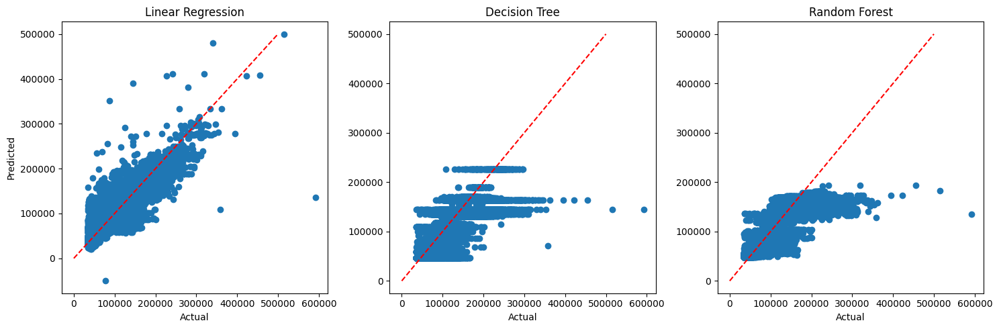

In [0]:
pandas_df_lr = predictions.select("Salaries", "prediction").toPandas()
pandas_df_dt = predictions_dt.select("Salaries", "prediction").toPandas()
pandas_df_rf = predictions_rf.select("Salaries", "prediction").toPandas()
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.scatter(pandas_df_lr["Salaries"], pandas_df_lr["prediction"], label='LR Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Linear Regression")
plt.xlabel("Actual")
plt.ylabel("Predicted")

plt.subplot(1, 3, 2)
plt.scatter(pandas_df_dt["Salaries"], pandas_df_dt["prediction"], label='DT Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Decision Tree")
plt.xlabel("Actual")

plt.subplot(1, 3, 3)
plt.scatter(pandas_df_rf["Salaries"], pandas_df_rf["prediction"], label='RF Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Random Forest")
plt.xlabel("Actual")

plt.tight_layout()
plt.show()


# Visualization of Best Model Predictions Across Different Regression Techniques

This section presents a comparative visual analysis of the best model predictions from three distinct regression approaches: Linear Regression, Decision Tree, and Random Forest. The objective is to visually assess and compare how each model's predictions align with actual salary values. The steps involved are:

1. **Data Conversion for Plotting**:
   - Predictions from the best models of each regression type (Linear Regression, Decision Tree, Random Forest) are converted from PySpark DataFrames to Pandas DataFrames. This conversion is necessary for effective plotting using matplotlib.

2. **Setting Up the Plot Area**:
   - A figure with dimensions 15x5 inches is created to accommodate three subplots, each representing a different regression model.

3. **Plotting Predictions for Each Model**:
   - **Linear Regression**: The first subplot visualizes the actual versus predicted salaries for the Linear Regression model. Predictions are plotted as a scatter plot, and a red dashed line indicates the line of perfect prediction (where actual equals predicted values).
   - **Decision Tree**: The second subplot repeats this visualization for the Decision Tree model, showing the scatter of predictions in relation to the ideal line.
   - **Random Forest**: The third subplot displays the Random Forest model's predictions, again using a scatter plot for comparison against the ideal prediction line.

4. **Customizing Each Plot**:
   - Each subplot is titled according to the corresponding regression model ("Linear Regression," "Decision Tree," "Random Forest").
   - The x-axis is labeled as 'Actual' (representing actual salaries), and the y-axis as 'Predicted' in each plot.
   - The red dashed line in each plot serves as a benchmark to assess the accuracy of predictions—closeness to this line indicates higher accuracy.

5. **Display and Layout Adjustments**:
   - `tight_layout()` is used to automatically adjust the spacing of the subplots for optimal display.
   - The combined plot is then displayed, offering a side-by-side comparative view of how each model's predictions correlate with the actual salaries.

Through this visual comparison, we can gauge the predictive accuracy of each model, understanding which model best captures the complexities of the salary data and makes the most accurate predictions.


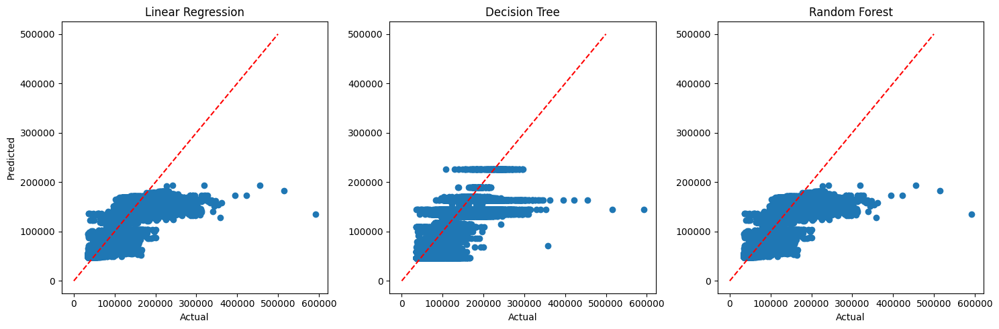

In [0]:
pandas_df_lr = best_predictions.select("Salaries", "prediction").toPandas()
pandas_df_dt = best_predictions_dt.select("Salaries", "prediction").toPandas()
pandas_df_rf = best_predictions_rf.select("Salaries", "prediction").toPandas()
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.scatter(pandas_df_lr["Salaries"], pandas_df_lr["prediction"], label='LR Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Linear Regression")
plt.xlabel("Actual")
plt.ylabel("Predicted")

plt.subplot(1, 3, 2)
plt.scatter(pandas_df_dt["Salaries"], pandas_df_dt["prediction"], label='DT Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Decision Tree")
plt.xlabel("Actual")

plt.subplot(1, 3, 3)
plt.scatter(pandas_df_rf["Salaries"], pandas_df_rf["prediction"], label='RF Predictions')
plt.plot([0, 500000], [0, 500000], 'r--')
plt.title("Random Forest")
plt.xlabel("Actual")

plt.tight_layout()
plt.show()
